In [24]:
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas_profiling as pp

In [3]:
Mens_Tourns = pd.read_csv("Resources/Mens_Tournaments.csv")
Mens_Tourns.columns
# result variable is referenced in player 1. If result = 1, player 1 won.
# FNL.1>FNL.2  Final Number of Games Won by Player 1 (Numeric-Integer)
# see MandWcolumns.txt for more details

Index(['Player1', 'Player2', 'Round', 'Result', 'FNL.1', 'FNL.2', 'FSP.1',
       'FSW.1', 'SSP.1', 'SSW.1', 'ACE.1', 'DBF.1', 'WNR.1', 'UFE.1', 'BPC.1',
       'BPW.1', 'NPA.1', 'NPW.1', 'TPW.1', 'ST1.1', 'ST2.1', 'ST3.1', 'ST4.1',
       'ST5.1', 'FSP.2', 'FSW.2', 'SSP.2', 'SSW.2', 'ACE.2', 'DBF.2', 'WNR.2',
       'UFE.2', 'BPC.2', 'BPW.2', 'NPA.2', 'NPW.2', 'TPW.2', 'ST1.2', 'ST2.2',
       'ST3.2', 'ST4.2', 'ST5.2'],
      dtype='object')

In [4]:
# view the df
Mens_Tourns.head(5)

,Player1,Player2,Round,Result,FNL.1,FNL.2,FSP.1,FSW.1,SSP.1,SSW.1,...,BPC.2,BPW.2,NPA.2,NPW.2,TPW.2,ST1.2,ST2.2,ST3.2,ST4.2,ST5.2
0,Lukas Lacko,Novak Djokovic,1,0,0,3,61,35,39,18,...,4,8,8.0,9.0,101.0,6,7.0,6.0,NaN,NaN
1,Leonardo Mayer,Albert Montanes,1,1,3,0,61,31,39,13,...,0,0,NaN,NaN,42.0,1,3.0,1.0,NaN,NaN
2,Marcos Baghdatis,Denis Istomin,1,0,0,3,52,53,48,20,...,4,13,12.0,16.0,126.0,6,7.0,6.0,NaN,NaN
3,Dmitry Tursunov,Michael Russell,1,1,3,0,53,39,47,24,...,1,7,NaN,NaN,79.0,2,2.0,3.0,NaN,NaN
4,Juan Monaco,Ernests Gulbis,1,0,1,3,76,63,24,12,...,3,5,16.0,28.0,127.0,1,6.0,7.0,6.0,NaN


In [5]:
# describe the data in the df
# I'll use another tool to do this better later on
Mens_Tourns.describe

<bound method NDFrame.describe of                     Player1                 Player2  Round  Result  FNL.1  \
0               Lukas Lacko          Novak Djokovic      1       0      0   
1            Leonardo Mayer         Albert Montanes      1       1      3   
2          Marcos Baghdatis           Denis Istomin      1       0      0   
3           Dmitry Tursunov         Michael Russell      1       1      3   
4               Juan Monaco          Ernests Gulbis      1       0      1   
5          Santiago Giraldo             Sam Querrey      1       0      1   
6                 Dudi Sela         Jarkko Nieminen      1       0      2   
7             Fabio Fognini      Alex Bogomolov Jr.      1       1      2   
8                David Guez         Richard Gasquet      1       0      0   
9         Nikolay Davydenko            Lukasz Kubot      1       1      3   
10      Pablo Carreno Busta        Julien Benneteau      1       0      2   
11            Tommy Robredo             Lu

In [9]:
# info about column data from the df
Mens_Tourns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 491 entries, 0 to 490
Data columns (total 42 columns):
Player1    491 non-null object
Player2    491 non-null object
Round      491 non-null int64
Result     491 non-null int64
FNL.1      491 non-null int64
FNL.2      491 non-null int64
FSP.1      491 non-null int64
FSW.1      491 non-null int64
SSP.1      491 non-null int64
SSW.1      491 non-null int64
ACE.1      491 non-null int64
DBF.1      487 non-null float64
WNR.1      365 non-null float64
UFE.1      365 non-null float64
BPC.1      491 non-null int64
BPW.1      491 non-null int64
NPA.1      431 non-null float64
NPW.1      431 non-null float64
TPW.1      377 non-null float64
ST1.1      491 non-null int64
ST2.1      490 non-null float64
ST3.1      483 non-null float64
ST4.1      221 non-null float64
ST5.1      86 non-null float64
FSP.2      491 non-null int64
FSW.2      491 non-null int64
SSP.2      491 non-null int64
SSW.2      491 non-null int64
ACE.2      491 non-null int64
DBF.

In [7]:
# Pandas Profiling combines several data exploration tools and techniques into one line of code.
# Creates quick and handy tables and visuals of data.
pp.ProfileReport(Mens_Tourns)

Number of variables,42
Number of observations,491
Total Missing (%),11.4%
Total size in memory,161.2 KiB
Average record size in memory,336.2 B
Numeric,39
Categorical,2
Boolean,1
Date,0
Text (Unique),0
Rejected,0


In [16]:
#remove columns that won't be used
Mens_Tourns_reduced = Mens_Tourns.drop(
    columns=[
        'ST1.1','ST2.1','ST3.1','ST4.1','ST5.1','ST1.2','ST2.2','ST3.2','ST4.2','ST5.2',
        'TPW.1','TPW.2','FNL.1','FNL.2', 'Player1','Player2',
    ]
)

In [17]:
#drop rows with missing values (na)
Mens_Tourns_reduced = Mens_Tourns_reduced.dropna()

In [18]:
pp.ProfileReport(Mens_Tourns_reduced)

Number of variables,27
Number of observations,339
Total Missing (%),0.0%
Total size in memory,71.6 KiB
Average record size in memory,216.2 B
Numeric,26
Categorical,0
Boolean,1
Date,0
Text (Unique),0
Rejected,0


In [19]:
## separate the columns into dependent and independent variables (or features and labels)
y = Mens_Tourns_reduced['Result']
# Keep everything else
X = Mens_Tourns_reduced.drop(columns=['Result'])

In [20]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

# Split dataset into two sets (training set and test set)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3) # 70% training and 30% test

# By specifying the train_size as 0.70, or the test_size as 0.3, we aim to put 70% of the data into our training set,
# and the rest of the data into the test set 

# print data from each group
print ("X_train: ", X_train)
print ("y_train: ", y_train)
print("X_test: ", X_test)
print ("y_test: ", y_test)

# It randomly picks data to form the training and test set, 
# which is usually a desirable feature in real-world applications to avoid possible artifacts existing 
# in the data preparation process

# After splitting, you will train the model on the training set and perform predictions on the test set.

X_train:       Round  FSP.1  FSW.1  SSP.1  SSW.1  ACE.1  DBF.1  WNR.1  UFE.1  BPC.1  \
490      7     65     40     35     15      4    4.0   31.0   40.0     13   
387      1     64     66     36     18     13    2.0   55.0   40.0      3   
453      2     61     41     39     16     13    7.0   38.0   29.0      3   
15       1     63     20     37      6      4    1.0   23.0   11.0      4   
31       1     66     39     34     19      9    0.0   35.0   17.0      4   
416      1     67     37     33     19      1    2.0   32.0   14.0     11   
109      3     64     23     36      7      1    5.0   17.0   32.0      1   
2        1     52     53     48     20      8    4.0   37.0   50.0      1   
239      4     63     73     37     31      8    2.0   42.0   39.0      7   
392      1     68     54     32     15     18    2.0   47.0   13.0      6   
429      1     78     86     22     20     11    2.0   45.0   30.0      8   
167      1     52     32     48     21     12    2.0   43.0   24.0

In [21]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier

## Create a random forest Classifier.
#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)
  #By convention, clf means 'Classifier'
    
    
#Train the model using the training sets y_pred=clf.predict(X_test)
# Train the Classifier to take the training features and learn how they relate to the training y
clf.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [22]:
y_pred=clf.predict(X_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8725490196078431


In [23]:
s1 = pd.Series(clf.feature_importances_)
s2 = pd.Series(X.columns)
feat_imp = pd.concat([s1, s2], axis=1).reset_index()
#sort dataframe
feat_imp.sort_values(0, ascending=False)

,index,0,1
21,21,0.181518,BPC.2
9,9,0.134059,BPC.1
10,10,0.097491,BPW.1
22,22,0.072439,BPW.2
19,19,0.071408,WNR.2
7,7,0.042401,WNR.1
14,14,0.040840,FSW.2
5,5,0.040122,ACE.1
20,20,0.035657,UFE.2
17,17,0.031457,ACE.2


No handles with labels found to put in legend.


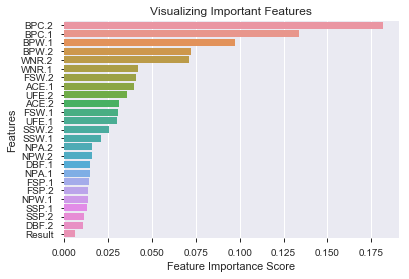

In [39]:
feature_names = list(Mens_Tourns_reduced.columns)
feature_names.pop(0)
feature_imp = pd.Series(clf.feature_importances_,index=feature_names).sort_values(ascending=False)

%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

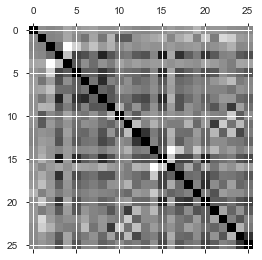

In [29]:
plt.matshow(Mens_Tourns_reduced.corr())
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000214195C65C0>,
      dtype=object)

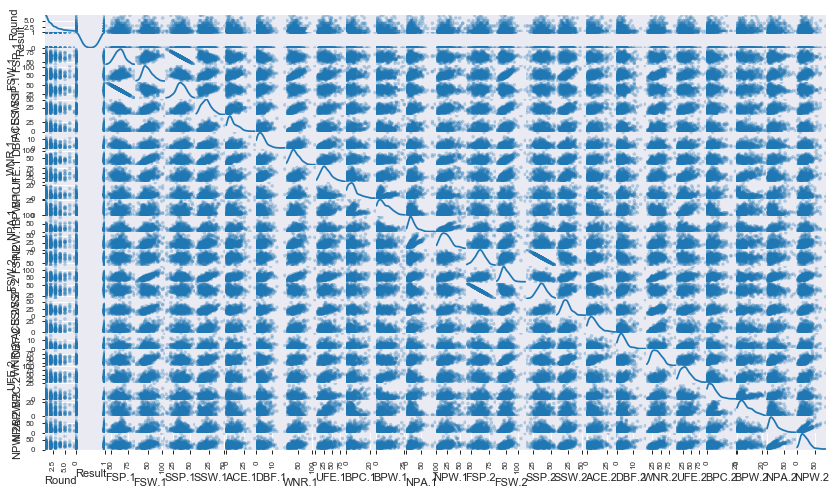

In [31]:
pd.plotting.scatter_matrix(Mens_Tourns_reduced, alpha = 0.3, figsize = (14,8), diagonal = 'kde')

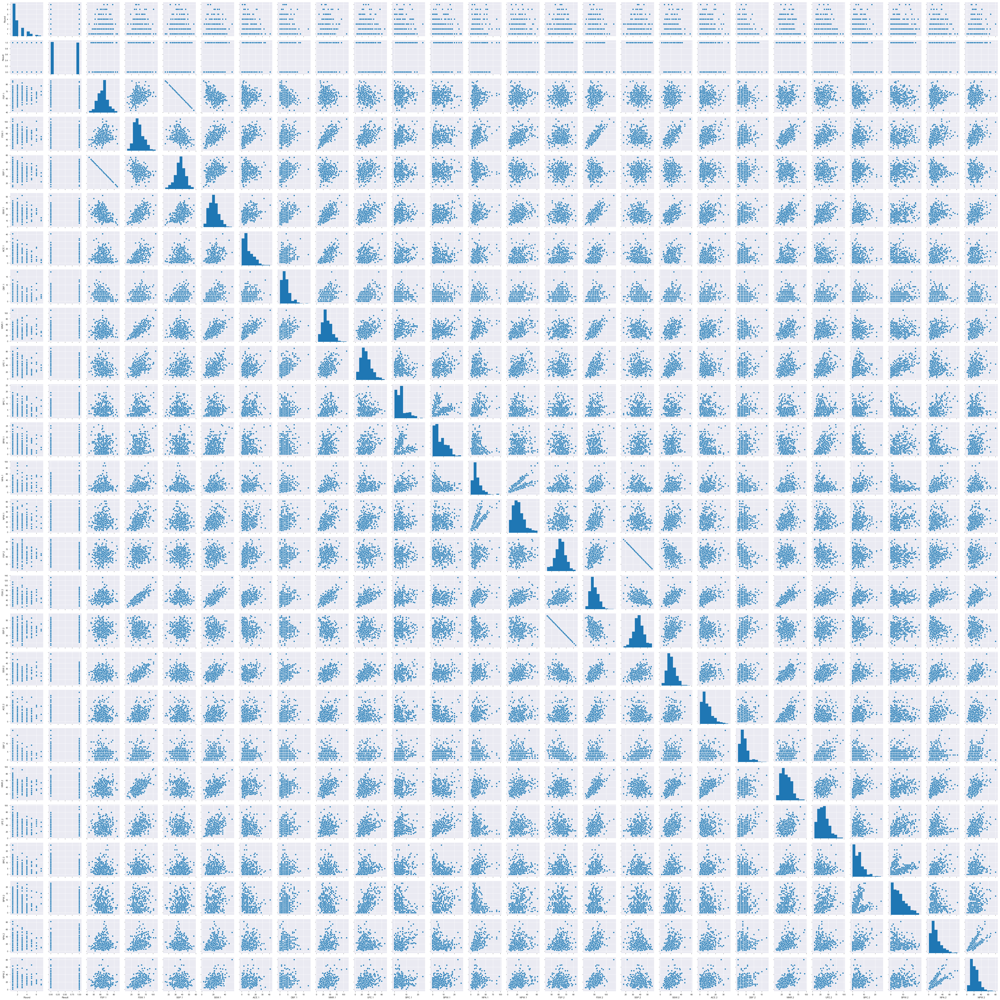

In [33]:
sns.pairplot(Mens_Tourns_reduced)

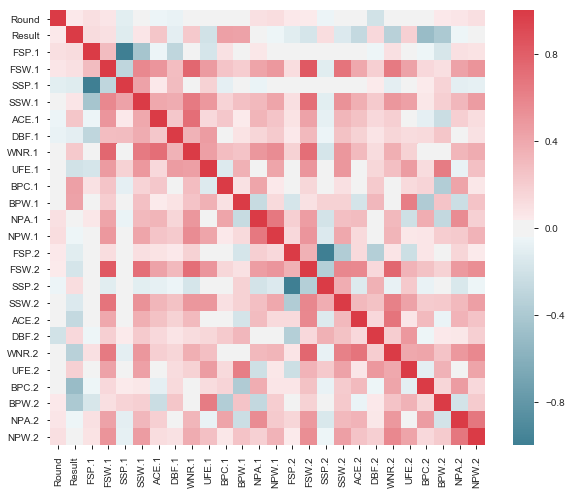

In [35]:
f, ax = plt.subplots(figsize=(10, 8))
corr = Mens_Tourns_reduced.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)